# Principal Component Analysis for Linear Dimensionality Reduction & Performance Evaluation Using Asthma and PathMNIST datasets

The number of features or variables used in a dataset is also known as the dimensionality. Often, using large number of features in the prediction can lead to complex or noisy models and introduction of unnecessary features. The process of dimensionality reduction helps in reducing the number of input features in the model, and to mitigate overfitting. Principal Component Analysis (or PCA) is one such technique for reducing dimensionality or number of features.

In this exercise, we will cover an example using PathMNIST dataset (from MedMNIST (https://medmnist.com/) and use PCA to conduct dimensionality reduction. 

As a next step, we will also train a multi-class classification model (where the output comprises of more than two classes, as would be the case for binary classification problems).

1. First, let's install medmnist, which would give us access to the code, data and libraries created by the developers of the mednist package, to allow data science enthusiasts to develop insights, and produce predictive models.

In [ ]:
# medmnist installation
# Terminal command for installing packages. pip is commonly used to install any python package.  Here, we pass in medmnist as the package name.  You can install any existing python packages using the command format pip install XXX, where XXX is the name of the desired package.
!pip install medmnist

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 87 kB 2.6 MB/s 
  Created wheel for fire: filename=fire-0.4.0-py2.py3-none-any.whl size=115942 sha256=4c89a6d1073af98c84c079726f66b2eb3e7fd69e8a57d172cc3cde0e809a5bf1
  Stored in directory: /root/.cache/pip/wheels/8a/67/fb/2e8a12fa16661b9d5af1f654bd199366799740a85c64981226
Successfully built fire


2. Next, we import some libraries required to run the code. We will use torch, an open-source machine learning framework, for this exercise. The input dataset **PathMNIST** is from a project called **MedMNIST**, a benchmark for lightweight biomedical image classification tasks. **PathMNIST** represents data that contains labeled examples depicting colorectal cancer. 

In [ ]:
%matplotlib inline
# Importing relevant packages
import IPython.core.display
IPython.core.display.set_matplotlib_formats("svg")
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from sklearn import *
from pprint import pprint
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms

# Medmnist packages
import medmnist
from medmnist import INFO, Evaluator

3. The data_flag field here helps pick the appropriate dataset. On MedMNIST, you will find 18 datasets, PathMNIST being one of them. Here, *INFO* and *info* are basically python dictionaries, with key and values pairs shown below.

In [ ]:
# There are a lot of different dataset.  The data_flag field is that specifies which dataset we are going to be pulling from.  The other parameters are self explanatory.
data_flag = 'pathmnist'
download = True

NUM_EPOCHS = 3
BATCH_SIZE = 128
# Learning Rate
lr = 0.001

info = INFO[data_flag]
task = info['task']
n_channels = info['n_channels']
n_classes = len(info['label'])

# Data retrieval into a class object
DataClass = getattr(medmnist, info['python_class'])

In [ ]:
print(type(INFO))
print(type(info))

<class 'dict'>
<class 'dict'>


In [ ]:
pprint(info)

{'MD5': 'a8b06965200029087d5bd730944a56c1',
 'description': 'The PathMNIST is based on a prior study for predicting '
                'survival from colorectal cancer histology slides, providing a '
                'dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image '
                'patches from hematoxylin & eosin stained histological images, '
                'and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches '
                'from a different clinical center. The dataset is comprised of '
                '9 types of tissues, resulting in a multi-class classification '
                'task. We resize the source images of 3×224×224 into 3×28×28, '
                'and split NCT-CRC-HE-100K into training and validation set '
                'with a ratio of 9:1. The CRC-VAL-HE-7K is treated as the test '
                'set.',
 'label': {'0': 'adipose',
           '1': 'background',
           '2': 'debris',
           '3': 'lymphocytes',
           '4': 'mucus',
 

In [ ]:
pprint(INFO)

{'adrenalmnist3d': {'MD5': 'bbd3c5a5576322bc4cdfea780653b1ce',
                    'description': 'The AdrenalMNIST3D is a new 3D shape '
                                   'classification dataset, consisting of '
                                   'shape masks from 1,584 left and right '
                                   'adrenal glands (i.e., 792 patients). '
                                   'Collected from Zhongshan Hospital '
                                   'Affiliated to Fudan University, each 3D '
                                   'shape of adrenal gland is annotated by an '
                                   'expert endocrinologist using abdominal '
                                   'computed tomography (CT), together with a '
                                   'binary classification label of normal '
                                   'adrenal gland or adrenal mass. Considering '
                                   'patient privacy, we do not provide the '
              

4. Now, we preprocess the data to create a transformation -- or normalize the data (as per z-scaling), and then we load the data in the **DataClass** format, following which we encapsulate it into dataloader format.

In [ ]:
# This transforms our data through tensor building and normalization.
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[.5], std=[.5])
])

# In these lines we split the dataset into training and testing data for future use.  These are all objects in the form of a python class.
train_dataset = DataClass(split='train', transform=data_transform, download=download)
test_dataset = DataClass(split='test', transform=data_transform, download=download)

pil_dataset = DataClass(split='train', download=download)

# Dataloader is simply the avenue that allows us to read in the data.  
train_loader = data.DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True)
train_loader_at_eval = data.DataLoader(dataset=train_dataset, batch_size=2*BATCH_SIZE, shuffle=False)
test_loader = data.DataLoader(dataset=test_dataset, batch_size=2*BATCH_SIZE, shuffle=False)

  0%|          | 0/205615438 [00:00<?, ?it/s]

Using downloaded and verified file: /root/.medmnist/pathmnist.npz
Using downloaded and verified file: /root/.medmnist/pathmnist.npz


In [ ]:
print(train_dataset)
print("===================")
print(test_dataset)

Dataset PathMNIST (pathmnist)
    Number of datapoints: 89996
    Root location: /root/.medmnist
    Split: train
    Task: multi-class
    Number of channels: 3
    Meaning of labels: {'0': 'adipose', '1': 'background', '2': 'debris', '3': 'lymphocytes', '4': 'mucus', '5': 'smooth muscle', '6': 'normal colon mucosa', '7': 'cancer-associated stroma', '8': 'colorectal adenocarcinoma epithelium'}
    Number of samples: {'train': 89996, 'val': 10004, 'test': 7180}
    Description: The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3×224×224 into 3×28×28, and split NCT-CRC-HE-100K into train

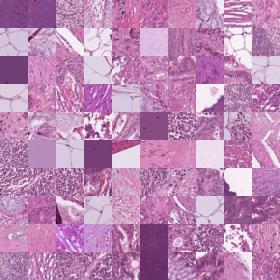

In [ ]:
# visualization through .montage
train_dataset.montage(length=10)

5. Train dataset has an attribute imgs, and we can see that the shape of it is 89,996 (number of pages), with each image being a 28 x 28 x 3 grid of numbers fully describing the pixel-orientation of a given image.

In [ ]:
print(type(train_dataset))
print(type(train_dataset.imgs))
print(train_dataset.imgs.shape)

<class 'medmnist.dataset.PathMNIST'>
<class 'numpy.ndarray'>
(89996, 28, 28, 3)


In [ ]:
print(train_dataset.imgs[1].shape)

(28, 28, 3)


6. Each image has an index which also defines the position of the image in the grid. For example, an image with index 0 is at the first position. Below, we extract indices from train dataset that represent labels 0, 1 or 2 -- or all images that represent **adipose, background or debris.**

In [ ]:
np.where(np.any(np.logical_or(train_dataset.labels == 0, train_dataset.labels == 1, train_dataset.labels == 2), axis=1))

(array([    0,    14,    15, ..., 89985, 89991, 89994]),)

We are going to use all of the train data from **PathMNIST** for the PCA exercise.

In [ ]:
# Splitting the images and their corresponding labels
train_images_1 = train_dataset.imgs
test_images_1 = test_dataset.imgs

train_labels_1 = train_dataset.labels
test_labels_1 = test_dataset.labels

7. Let's see what the image at index 14 looks like when seen on a grid of numbers.

Label: [2]
The actual image:


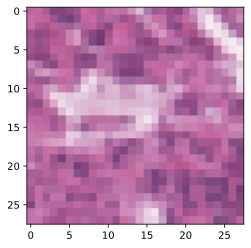

In [ ]:
plt.ion()
print('Label: ' + str(train_labels_1[80000]))
print('The actual image:')
plt.imshow(train_images_1[80000])
plt.show()

In [ ]:
print(train_images_1[80000].shape)

(28, 28, 3)


In [ ]:
# Viewing how a single image is stored
train_images_1[80000]

array([[[194,  99, 156],
        [193, 102, 159],
        [167,  94, 152],
        ...,
        [160,  88, 144],
        [175, 108, 160],
        [190, 123, 172]],

       [[200, 110, 163],
        [193, 103, 156],
        [191,  99, 153],
        ...,
        [167, 101, 154],
        [176, 104, 156],
        [204, 140, 184]],

       [[199, 107, 161],
        [175,  89, 146],
        [170,  83, 140],
        ...,
        [209, 169, 202],
        [161,  98, 150],
        [175, 102, 156]],

       ...,

       [[130,  70, 127],
        [188, 114, 166],
        [182, 107, 160],
        ...,
        [132,  73, 131],
        [136,  72, 129],
        [142,  74, 131]],

       [[191, 115, 170],
        [202, 126, 178],
        [194, 113, 167],
        ...,
        [157,  91, 146],
        [157,  83, 140],
        [140,  76, 133]],

       [[198, 111, 166],
        [192, 115, 169],
        [169,  94, 150],
        ...,
        [134,  77, 133],
        [158,  83, 140],
        [184, 102, 156]]

In [ ]:
# Reshaping the above iamge into our desired dimensions
train1_images_1_reshaped = train_images_1[80000].reshape(1,28*28*3)

In [ ]:
train1_images_1_reshaped

array([[194,  99, 156, ..., 184, 102, 156]], dtype=uint8)

In [ ]:
# Transformed image
train_dataset.imgs[[14]]

array([[[[237, 221, 236],
         [237, 221, 236],
         [237, 222, 237],
         ...,
         [237, 220, 235],
         [237, 221, 236],
         [237, 221, 235]],

        [[237, 221, 236],
         [237, 221, 236],
         [237, 221, 236],
         ...,
         [237, 221, 235],
         [237, 221, 236],
         [237, 221, 236]],

        [[236, 221, 237],
         [237, 221, 236],
         [236, 219, 235],
         ...,
         [237, 220, 235],
         [237, 221, 236],
         [237, 221, 236]],

        ...,

        [[237, 221, 236],
         [237, 221, 236],
         [237, 221, 236],
         ...,
         [237, 220, 235],
         [237, 221, 236],
         [237, 221, 236]],

        [[236, 219, 232],
         [237, 222, 236],
         [237, 221, 236],
         ...,
         [237, 220, 235],
         [237, 221, 235],
         [237, 221, 236]],

        [[235, 212, 225],
         [237, 221, 236],
         [237, 221, 236],
         ...,
         [237, 221, 236],
        

Here, we are converting the label to integer type, for programmatic convenience at a later stage in the pipeline.

In [ ]:
# Here, we convert each label to an integer for the training labels
train_labels_1[train_labels_1 == 0] = int(0)
train_labels_1[train_labels_1 == 1] = int(1)
train_labels_1[train_labels_1 == 2] = int(2)
train_labels_1[train_labels_1 == 3] = int(3)
train_labels_1[train_labels_1 == 4] = int(4)
train_labels_1[train_labels_1 == 5] = int(5)
train_labels_1[train_labels_1 == 6] = int(6)
train_labels_1[train_labels_1 == 7] = int(7)
train_labels_1[train_labels_1 == 8] = int(8)

# Here, we convert each label to an integer for the testing labels
test_labels_1[test_labels_1 == 0] = int(0)
test_labels_1[test_labels_1 == 1] = int(1)
test_labels_1[test_labels_1 == 2] = int(2)
test_labels_1[test_labels_1 == 3] = int(3)
test_labels_1[test_labels_1 == 4] = int(4)
test_labels_1[test_labels_1 == 5] = int(5)
test_labels_1[test_labels_1 == 6] = int(6)
test_labels_1[test_labels_1 == 7] = int(7)
test_labels_1[test_labels_1 == 8] = int(8)

Since every image in the grid is a 28 x 28 x 3 matrix, and since dataset used as input to the PCA algorithm is represented as a 2-dimensional table, we would need to flatten the dataset, or rearrange the 28 x 28 x 3 matrix, such as it is transformed to a 2-dimensional matrix with rows = number of images, and columns = 28x28x3 = 2352. 

In [ ]:
# Flatten the dataset
nsamples, nx, ny, nz = train_images_1.shape
train_images_1_reshaped = train_images_1.reshape((nsamples,nx*ny*nz))

In [ ]:
train_images_1

array([[[[220, 208, 227],
         [219, 207, 227],
         [220, 207, 227],
         ...,
         [220, 208, 227],
         [219, 207, 227],
         [221, 208, 227]],

        [[218, 206, 226],
         [220, 207, 226],
         [219, 206, 226],
         ...,
         [197, 177, 202],
         [192, 172, 197],
         [190, 168, 195]],

        [[220, 208, 226],
         [220, 207, 226],
         [219, 205, 225],
         ...,
         [208, 191, 213],
         [207, 192, 213],
         [209, 194, 216]],

        ...,

        [[218, 205, 225],
         [217, 201, 222],
         [221, 208, 227],
         ...,
         [221, 208, 227],
         [220, 208, 227],
         [221, 209, 227]],

        [[213, 192, 218],
         [217, 200, 222],
         [221, 208, 227],
         ...,
         [221, 208, 227],
         [221, 209, 227],
         [221, 208, 227]],

        [[215, 195, 220],
         [220, 207, 226],
         [221, 208, 227],
         ...,
         [220, 208, 227],
        

In [ ]:
print(nsamples)
print(nx)
print(ny)
print(nz)

89996
28
28
3


In [ ]:
# Flatten the dataset for the testing dataset
nsamples, nx, ny, nz = test_images_1.shape
test_images_1_reshaped = test_images_1.reshape((nsamples,nx*ny*nz))

In [ ]:
train_images_1_reshaped.shape

(89996, 2352)

In [ ]:
train_images_1_reshaped

array([[220, 208, 227, ..., 222, 209, 228],
       [126,  59, 119, ..., 177, 137, 184],
       [223, 168, 204, ..., 223, 155, 196],
       ...,
       [201, 141, 191, ..., 196, 141, 190],
       [226, 215, 229, ..., 226, 215, 229],
       [198, 120, 174, ..., 186, 109, 164]], dtype=uint8)

In [ ]:
test_images_1_reshaped.shape

(7180, 2352)

In [ ]:
test_images_1_reshaped

array([[190, 114, 165, ..., 144,  78, 137],
       [200, 159, 199, ..., 156, 113, 166],
       [238, 230, 238, ..., 156, 112, 160],
       ...,
       [173, 131, 180, ..., 170, 124, 176],
       [132,  64, 123, ..., 155,  85, 142],
       [145,  82, 142, ..., 163,  98, 155]], dtype=uint8)

Since the PCA algorithm is sensitive to scale, we standardize the data according to standard scaler, which means we convert each number to its z-score (Val - mean / Std.dev)

In [ ]:
# Standardize the data since PCA is highly sensitive to the scale
scaler = preprocessing.StandardScaler()

# Transform the reshaped images
scaler.fit_transform(train_images_1_reshaped)

# Store the inputs of the training and testing sets
trainX = scaler.transform(train_images_1_reshaped)
testX = scaler.transform(test_images_1_reshaped)

In [ ]:
print(trainX.shape)
print(testX.shape)

(89996, 2352)
(7180, 2352)


Applying PCA means converting the matrix into so-called "principal components" where each principal component is a linear combination of the existing variables (in our case every one of the 2352 features). In some sense, we might think, that all 2352 features together explain 100% of the entire variability in the dataset. Using fewer principal components, we might be able to explain most of the variability in the dataset, where number of principal components is far fewer than the number of features. Let's try below with a variation of 2 principal components.

In [ ]:
# Apply the PCA using two components
pca = decomposition.PCA(n_components = 2)

# Fit the training set
proj = pca.fit_transform(trainX)

# Visualization fo the projections
plt.scatter(proj[:, 0], proj[:, 1], c=list(map(int, train_labels_1)), cmap=plt.cm.jet, s=20)
plt.colorbar()

It looks like 2 principal components explain over half of the underlying variability in the dataset.

In [ ]:
# Calculate the percentage of explained variance
sum(pca.explained_variance_ratio_)

0.5702646349740822

Let's flip the question and ask: how many principal components would explain 90% of the underlying variability in the dataset?

In [ ]:
# Apply the PCA 
# the parameter we insert is 0.9
# this means that we select the number of components such that 
# the amount of variance that needs to be explained is greater than the percentage specified by n_components.
pca = decomposition.PCA(0.9)

# fit the training set 
trainX_90 = pca.fit_transform(trainX)

In [ ]:
pca

PCA(n_components=0.9)

In [ ]:
trainX_90.shape

(89996, 185)

So, a lot more than 2 -- at 185 components.

In [ ]:
pca.n_components_

185

7. Recall, how with PCA algorithm, we convert the original data into a set of principal components that are a linear combination of the original features. So, basically, you can go back and forth, by converting original data to all PCs, and also from all PCs to the original data. The accuracy with original data is produced from PCs depends on the number of PCs being used to generate that data. For example, 2 PCs reproduce a little over 57% of the total variability in the original data, so we can produce a compression of the original data using these 2 PCs. This compression will be farther off from original data when built from 2 PCs as compared to that build from 185 PCs (where 185 PCs reproduce 90% of the variability in the original data). The process of generating the compressed data from the PCs uses the Inverse Transform algorithm depicted in the next step.

In [ ]:
# Apply the inverse transformation on the trained set
compressed_image = pca.inverse_transform(trainX_90)

In [ ]:
compressed_image.shape

(89996, 2352)

In [ ]:
trainX[6].shape

(2352,)

In [ ]:
# View of one element in the training
trainX[6]

array([-0.46563235, -0.43773956, -0.46847046, ...,  0.5256317 ,
        0.66986597,  0.55044674])

See the loss of image resolution that occurs when the image is represented using 185 covariates instead of the full 2352 covariates. The idea behind PCA is to compress the image in a manner such that, the compressed image still represents the original image by capturing the underlying 90% variability in the dataset.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, '90% of explained variance')

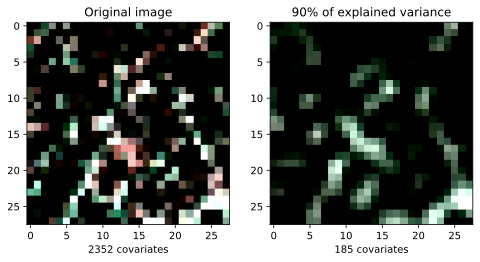

In [ ]:
compressed_image = pca.inverse_transform(trainX_90)

plt.figure(figsize=(8, 4))

# original image
plt.subplot(1, 2, 1)
plt.imshow(trainX[6].reshape(28, 28, 3), cmap=plt.cm.gray,interpolation='nearest')
plt.xlabel('2352 covariates')
plt.title('Original image')

# compressed image
plt.subplot(1, 2, 2)
plt.imshow(compressed_image[6].reshape(28, 28, 3), cmap=plt.cm.gray, interpolation='nearest')
plt.xlabel('185 covariates')
plt.title('90% of explained variance')

In [ ]:
#How many principal components represents 95% of the variability in the underlying dataset? Plot the original image, 
#with the 95% explained variance image as shown in the cell above




##Evaluating Classification Performance

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import *
import numpy as np
import seaborn as sns

1. Here, we will consider a dataset to predict the occurrence of asthma in a patient, given some variables as depicted here: [Asthma data](https://drive.google.com/file/d/1QAWVV9q3h1eHoMNgTfqPy2Z5TmXnGaRB/view?usp=sharing)

In [ ]:
# Read in data from github 
!wget "https://raw.githubusercontent.com/jlgrons/JSC270_Lab8/master/JSC270_Lab8data_20210323.csv"

--2022-07-11 06:27:45--  https://raw.githubusercontent.com/jlgrons/JSC270_Lab8/master/JSC270_Lab8data_20210323.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109115 (107K) [text/plain]
Saving to: ‘JSC270_Lab8data_20210323.csv’

JSC270_Lab8data_202 100%[===================>] 106.56K  --.-KB/s    in 0.02s   

2022-07-11 06:27:45 (5.32 MB/s) - ‘JSC270_Lab8data_20210323.csv’ saved [109115/109115]



In [ ]:
# Reading in the CSV file
as_data = pd.read_csv(r'JSC270_Lab8data_20210323.csv', encoding= 'latin1')
# Displaying the first 5 rows
as_data.head()

,fev1_z,asthma,sev_asthma,pred_fev1_z,asthma_pred,sev_asthma_pred,age,lang_at_home,sex,income
0,-1.207066,0,1,-0.380462,0.706606,0.193648,15.100756,english,F,high
1,0.277429,1,1,0.888451,0.787937,0.356634,6.389002,english,F,high
2,1.084441,1,1,1.625245,0.384394,0.924491,9.149318,english,M,high
3,-2.345698,0,0,-4.299877,0.017826,0.171789,13.340099,mandarin,M,low
4,0.429125,1,1,0.799398,0.611069,0.954608,19.076183,english,F,high


In [ ]:
as_data.shape

(1000, 10)

Suppose you are asked to create a tool that can help doctors decide whether to treat an individual for asthma by using the sound of someone blowing on their phone mic and returning: (1) the probability of asthma, (2) the probability of severe asthma, and (3) lung function (as measured by normalized forced experatory volume in 1 second, FEV1). This dataset is a simulated representation of the validation dataset you would have after modeling using an independent training dataset collected from patients who are seen in a respirology clinic.  

This data simulates the output from 3 models: 

- a continuous outcome model (pred_fev1_z)
- an unbalanced data-set classifier (sev_asthma_pred)
- a balanced data-set classifier (asthma_pred)
 
The true labels for these models are: 

- fev1_z
- asthma
- sev_asthma

### Now, let's compute some basic performance metrics for your tool focusing on the binary asthma outcome.

### Recall your confusion matrix: 

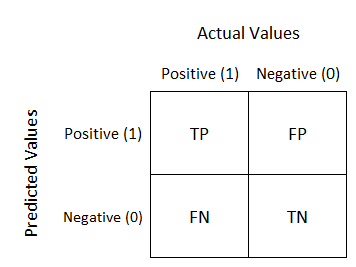

####Asthma classifier
- Area under the receiver-operator curve (AUROC): FPR vs TPR
    - Sensitivity = True Positive Rate = TP/(TP + FN)
    - Specificity = TN/(TN + FP) = 1 - FP/(TN + FP) = 1 - FPR
    - False Postive Rate (FPR) = FP/(TN + FP) 

- Area under the precision-recall curve (AUPRC): Precision vs Recall
    - Precision = TP/(TP + FP)
    - Recall = TP/(TP + FN) = Sensitivity

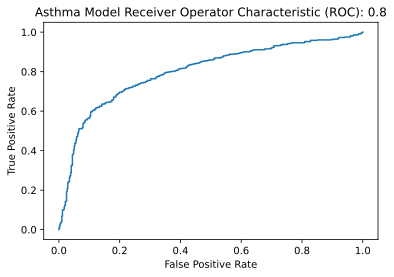

In [ ]:
## AUROC
fpr, tpr, thresholds = roc_curve(as_data.asthma.to_numpy(), as_data.asthma_pred.to_numpy(), 
                                 pos_label = 1)

asthma_auroc = roc_auc_score(as_data.asthma.to_numpy(), as_data.asthma_pred.to_numpy())

# Plotting the false positive rate against eh true positive rate
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Asthma Model Receiver Operator Characteristic (ROC): ' + str(round(asthma_auroc,3)))
plt.show()


#### What is the range of AUC?  What is the shape of a perfect ROC curve?

In [ ]:
### AUC ranges from 0 and 1, with 0.5 indicating "random guessing"
### A perfect ROC curve is a right angle that starts at (0,0), turns right at (0,1), and ends at (1,1)

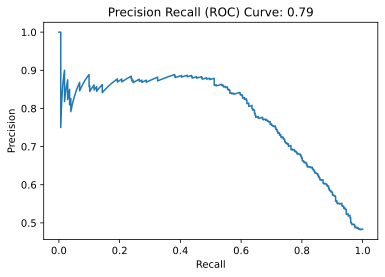

In [ ]:
### Precision, Recall
precision, recall, thresholds_pr = precision_recall_curve(as_data.asthma.to_numpy(), as_data.asthma_pred.to_numpy(), pos_label = 1)

asthma_auprc = average_precision_score(as_data.asthma.to_numpy(), as_data.asthma_pred.to_numpy())

plt.plot(recall, precision)
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.title('Precision Recall (ROC) Curve: ' + str(round(asthma_auprc, 2)))
plt.show()

# Alternative way to display the plot
# pr_display = PrecisionRecallDisplay(precision=precision,recall=recall,average_precision=asthma_auprc,estimator_name='AUPRC').plot()

Now, let's look at specific thresholds to evaluate: 
- accuracy
- true positives (TP), false positives (FP), true negatives (TN), false negatives (FN)
- sensitivity (recall)
- specificity
- precision

([all metrics here](https://scikit-learn.org/stable/modules/model_evaluation.html))

In [ ]:
as_threshold = 0.5 # standard threshold

# Predictions and converting to binary
as_dich_pred = (as_data.asthma_pred.to_numpy() > as_threshold).astype(int)
as_dich_true = as_data.asthma.to_numpy()

## Accuracy
as_acc = accuracy_score(as_dich_true, as_dich_pred)

## Confusion matrix
c_mat = confusion_matrix(as_dich_true, as_dich_pred)

TN, FP, FN, TP = c_mat.ravel()

print("Asthma model")
print("Accuracy: " + str(round(as_acc, 2)))
print("True positives: " + str(round(TP)))
print("True negatives: " + str(round(TN)))
print("False positives: " + str(round(FP)))
print("False negatives: " + str(round(FN)))

print("Confusion matrix")
print(c_mat)

Asthma model
Accuracy: 0.73
True positives: 369
True negatives: 358
False positives: 159
False negatives: 114
Confusion matrix
[[358 159]
 [114 369]]


In [ ]:
## Compute metrics
as_sens = TP/(TP + FN)
as_spec = TN/(TN + FP)
as_prec = TP/(TP + FP)

print("Sensitivity (Recall): " + str(round(as_sens, 2)))
print("Specificity: " + str(round(as_spec, 2)))
print("Precision: " + str(round(as_prec, 2)))

Sensitivity (Recall): 0.76
Specificity: 0.69
Precision: 0.7


In [ ]:
#### Q: What happens when you change the threshold to 0.2? What about 0.8?  Why does this happen?:


Lets see if we can repeat this exercise for the PATHMNIST dataset

In [ ]:
# Retriving the training and testing set for PATHMNIST
train_images_1_2 = train_dataset.imgs[[i for i, x in enumerate(np.logical_or(train_dataset.labels == 0, train_dataset.labels == 1)) if x]]
test_images_1_2 = test_dataset.imgs[[i for i, x in enumerate(np.logical_or(test_dataset.labels == 0, test_dataset.labels == 1)) if x]]

train_labels_1_2 = train_dataset.labels[[i for i, x in enumerate(np.logical_or(train_dataset.labels == 0, train_dataset.labels == 1)) if x]]
test_labels_1_2 = test_dataset.labels[[i for i, x in enumerate(np.logical_or(test_dataset.labels == 0, test_dataset.labels == 1)) if x]]

In [ ]:
# Converting labels to integers
train_labels_1_2[train_labels_1_2 == 0] = int(0)
train_labels_1_2[train_labels_1_2 == 1] = int(1)

test_labels_1_2[test_labels_1_2 == 0] = int(0)
test_labels_1_2[test_labels_1_2 == 1] = int(1)

In [ ]:
print(train_labels_1_2[train_labels_1_2 == 0].shape)
print(train_labels_1_2[train_labels_1_2 == 1].shape)
print(test_labels_1_2[test_labels_1_2 == 0].shape)
print(test_labels_1_2[test_labels_1_2 == 1].shape)

(9366,)
(9509,)
(1338,)
(847,)


In [ ]:
# Flatten the dataset
nsamples, nx, ny, nz = train_images_1_2.shape
train_images_1_2_reshaped = train_images_1_2.reshape((nsamples,nx*ny*nz))

In [ ]:
# Flatten the dataset for the testing dataset
nsamples, nx, ny, nz = test_images_1_2.shape
test_images_1_2_reshaped = test_images_1_2.reshape((nsamples,nx*ny*nz))

In [ ]:
# Normalizing the data and transforming the inputs
scaler = preprocessing.StandardScaler()

scaler.fit_transform(train_images_1_2_reshaped)

trainX = scaler.transform(train_images_1_2_reshaped)
testX = scaler.transform(test_images_1_2_reshaped)

In [ ]:
trainX.shape

(18875, 2352)

In [ ]:
testX.shape

(2185, 2352)

### Confusion Matrix: 

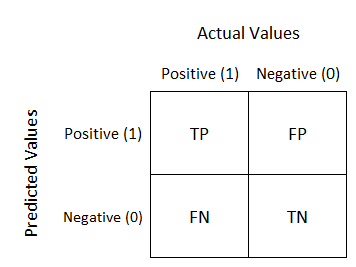

- Area under the receiver-operator curve (AUROC): FPR vs TPR
    - Sensitivity = True Positive Rate = TP/(TP + FN)
    - Specificity = TN/(TN + FP) = 1 - FP/(TN + FP) = 1 - FPR
    - False Postive Rate (FPR) = FP/(TN + FP) 

- Area under the precision-recall curve (AUPRC): Precision vs Recall
    - Precision = TP/(TP + FP)
    - Recall = TP/(TP + FN) = Sensitivity

In [ ]:
print(train_labels_1_2.shape)
print(test_labels_1_2.shape)

(18875,)
(2185,)


In [ ]:
import time 

# Logging run time
start = time.time()

# Model fitting using saga and a max iteratin value of 10
logreg = linear_model.LogisticRegression(penalty='l1', solver = 'saga', max_iter = 10)
logreg.fit(trainX, train_labels_1_2)
stop = time.time()

print("training time  =", stop - start)

# predict from the model
predYtest  = logreg.predict(testX)

# calculate accuracy for testing set
acc      = metrics.accuracy_score(test_labels_1_2, predYtest)
print("test accuracy  =", acc)

training time  = 8.87087631225586
test accuracy  = 0.974370709382151


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


In [ ]:
predYtest.shape

(2185,)

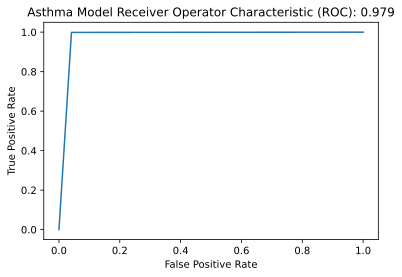

In [ ]:
## AUROC
from sklearn.metrics import *

fpr, tpr, thresholds = roc_curve(test_labels_1_2, predYtest, 
                                 pos_label = 1)

asthma_auroc = roc_auc_score(test_labels_1_2, predYtest)

plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Asthma Model Receiver Operator Characteristic (ROC): ' + str(round(asthma_auroc,3)))
plt.show()

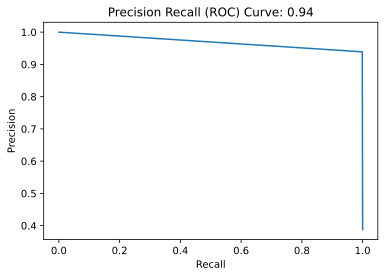

In [ ]:
### AUPRC
precision, recall, thresholds_pr = precision_recall_curve(test_labels_1_2, predYtest, pos_label = 1)

asthma_auprc = average_precision_score(test_labels_1_2, predYtest)

plt.plot(recall, precision)
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.title('Precision Recall (ROC) Curve: ' + str(round(asthma_auprc, 2)))
plt.show()

# Alternative way to display the plot
# pr_display = PrecisionRecallDisplay(precision=precision,recall=recall,average_precision=asthma_auprc,estimator_name='AUPRC').plot()

In [ ]:
as_threshold = 0.5 # standard threshold

as_dich_pred = (predYtest > as_threshold).astype(int)
as_dich_true = test_labels_1_2

## accuracy
as_acc = accuracy_score(as_dich_true, as_dich_pred)

## confusion matrix
c_mat = confusion_matrix(as_dich_true, as_dich_pred)

TN, FP, FN, TP = c_mat.ravel()

print("Asthma model")
print("Accuracy: " + str(round(as_acc, 2)))
print("True positives: " + str(round(TP)))
print("True negatives: " + str(round(TN)))
print("False positives: " + str(round(FP)))
print("False negatives: " + str(round(FN)))

print("Confusion matrix")
print(c_mat)

Asthma model
Accuracy: 0.97
True positives: 846
True negatives: 1283
False positives: 55
False negatives: 1
Confusion matrix
[[1283   55]
 [   1  846]]


In [ ]:
## Compute metrics
as_sens = TP/(TP + FN)
as_spec = TN/(TN + FP)
as_prec = TP/(TP + FP)

print("Sensitivity (Recall): " + str(round(as_sens, 2)))
print("Specificity: " + str(round(as_spec, 2)))
print("Precision: " + str(round(as_prec, 2)))

Sensitivity (Recall): 1.0
Specificity: 0.47
Precision: 0.54
